In [1]:
from shapely.geometry import LineString, Point
from shapely.ops import transform
from shapely import affinity
from shapely.ops import cascaded_union
from math import sqrt
from functools import partial

In [2]:
import pyproj
utm32 = pyproj.Proj(init='epsg:32632')
wgs84 = pyproj.Proj(init='epsg:4326')

def wgs84tomap_transform(map_origin, map_orientation=0.0):
    x0, y0 = pyproj.transform(wgs84, utm32, *map_origin)
    def t(y, x):
        x1, y1 = pyproj.transform(wgs84, utm32, x, y)
        x1 = x1 - x0
        y1 = y1 - y0
        if map_orientation:
            x1 = cos(map_orientation)*x1 + sin(map_orientation)*y1
            y1 = - sin(map_orientation)*x1 + cos(map_orientation)*y1
        return (x1, y1)
    return t

In [3]:
o_img = (8.91909, 46.02620) 
o_map = (8.919781, 46.025830)
project = wgs84tomap_transform(o_map)
o_utm32_img = pyproj.transform(wgs84, utm32, *o_img)
o_utm32_map = pyproj.transform(wgs84, utm32, *o_map)
mx = o_utm32_img[0] - o_utm32_map[0]
my = o_utm32_img[1] - o_utm32_map[1]

In [4]:
from owslib.wms import WebMapService
import wms_credentials
import PIL.Image
import io

wms_url = "https://wms.swisstopo.admin.ch/wss/httpauth/swisstopowms/"
wms = WebMapService(wms_url, username=wms_credentials.username, password=wms_credentials.password)
layer_name = 'ch.swisstopo.swisstlm3d-karte-grau'
image_format = 'image/png'
crs = 'EPSG:32632' #WGS 84 / UTM zone 32N
assert layer_name in wms.contents
assert image_format in wms.getOperationByName('GetMap').formatOptions

layer = wms[layer_name]
assert crs in layer.crsOptions

def get_map(center, size, px_width=640):
    w, h = size
    x, y = center
    bbox = (x-w*0.5, y-h*0.5, x+w*0.5, y+h*0.5)
    px_size = (px_width, int(px_width*h/w))
    img = wms.getmap(layers=[layer_name], srs=crs, bbox=bbox, format=image_format, transparent=True, size=px_size)
    m = PIL.Image.open(io.BytesIO(img.read()))
    m.origin = center
    m.o_size = size
    return m

In [5]:
def plot_map(map_img,  map_origin, size=None,):
    if size is None:
        size = map_img.o_size
    w, h = size
    x, y = map_img.origin
    ox, oy = map_origin
    return imshow(map_img, extent=(x-ox-w/2, x-ox+w/2, y-oy-h/2, y-oy+h/2))


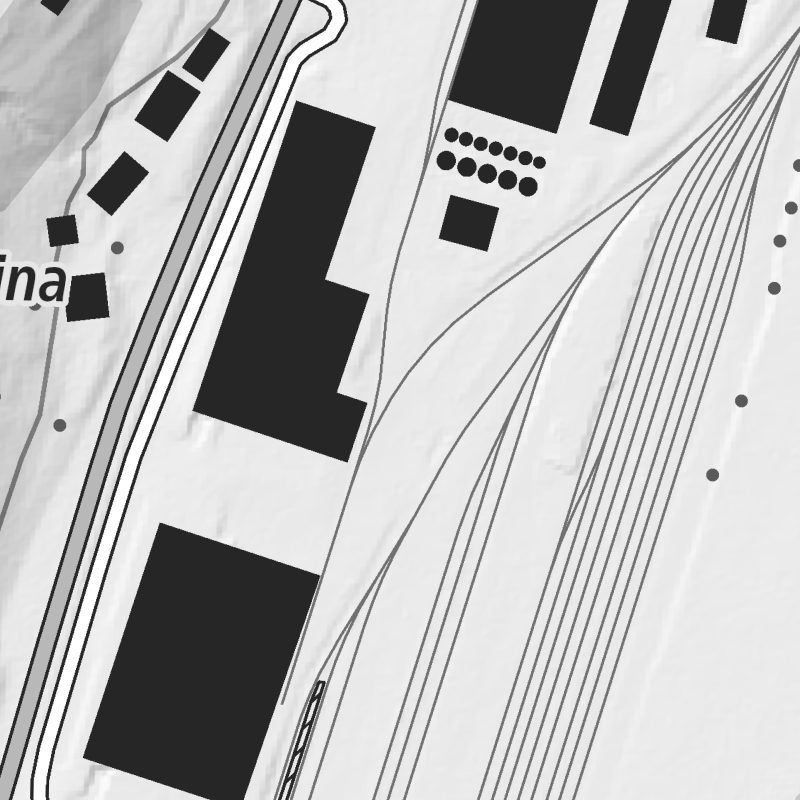

In [6]:
i = get_map(o_utm32_img, (300, 300), px_width=800)
i

In [7]:
import numpy as np

In [8]:
import rosbag
from sensor_msgs.msg import Imu, NavSatFix
from nav_msgs.msg import Odometry
import std_msgs.msg

In [9]:
from matplotlib.pyplot import plot, axis, figure, imshow, legend, polar
import matplotlib.image as mpimg
%matplotlib inline
import mpld3
mpld3.enable_notebook()
import descartes

In [10]:
def plot_cov(ax, p, **kwargs):
    if p:
        patch = descartes.PolygonPatch(p, alpha=0.5, zorder=1, **kwargs)
        return ax.add_patch(patch)
    return None

In [11]:
def plot_path(ax, line, **kwargs):
    if line:
        x,y = line.xy
        return ax.plot(x, y,'.-', linewidth=1, solid_capstyle='round', zorder=2, **kwargs)[0]
    else:
        return None

In [12]:
def cov_ellipse(center, cov):
    cov2d = cov[:2,:2]
    e, v = np.linalg.eig(cov2d)
    theta = np.arccos(v[0][0])
    p = Point(center).buffer(1)
    p = affinity.scale(p, sqrt(e[0]),sqrt(e[1]))
    p = affinity.rotate(p, theta)
    return p

In [13]:
def cov_ellipse_fix(d):
    cov = d.position_covariance
    p = Point(project(d.latitude, d.longitude)).buffer(1)
    return affinity.scale(p, sqrt(cov[0]),sqrt(cov[4]))

In [14]:
def odom_covariance(bag, topic):
    ms = bag.read_messages(topics=[topic])
    es = [cov_ellipse((d.pose.pose.position.x, d.pose.pose.position.y),np.array(d.pose.covariance).reshape(6,6)) 
          for i, (_, d, td) in enumerate(ms) if i % 50 == 0]
    if len(es)>1:
        return cascaded_union(es[1:-20])
    else:
        return None

In [15]:
def fix_covariance(bag, topic):
    ms = bag.read_messages(topics=[topic])
    es = [cov_ellipse(project(d.latitude, d.longitude),np.array(d.position_covariance).reshape(3,3)) for _, d, td in ms]
    if es:
        return cascaded_union(es)
    else:
        return None

In [16]:
def fix_path(bag, topic):
    ms = bag.read_messages(topics=[topic])
    poses = [(d.latitude, d.longitude) for _, d, ts in ms]
    if poses:
        return transform(project, LineString(poses))
    return None

In [17]:
def odometry_path(bag, topic):
    ms = bag.read_messages(topics=[topic])
    poses = [d.pose.pose.position for _, d, ts in ms]
    if poses:
        return LineString([(p.x,p.y) for p in poses])
    return None

In [18]:
def plot_paths(bag):
    fig = figure(figsize=(12,12))
    ax = fig.add_subplot(111)
    plot_map(i, size=(300,300), map_origin=o_utm32_map)
    
    paths = {'fix': ('/fix', fix_path, fix_covariance, 'red'),
             'android fix': ('/android/fix',fix_path, fix_covariance, 'blue'),
             'odom': ('/pose', odometry_path, None, 'black'),
             #'gps': ('/odometry/gps', odometry_path, None)
             'filtered': ('/odometry/filtered', odometry_path, odom_covariance, 'green')
            }
    
    handles = []
    for label, (topic, p, c, color) in paths.items():
        if p:
            path = plot_path(ax, p(bag, topic), color=color, label=label)
            if path:
                handles.append(path)
        if c:
            plot_cov(ax, c(bag, topic), fc=color, ec=color)
    
    legend(handles=handles)
    fig.show()

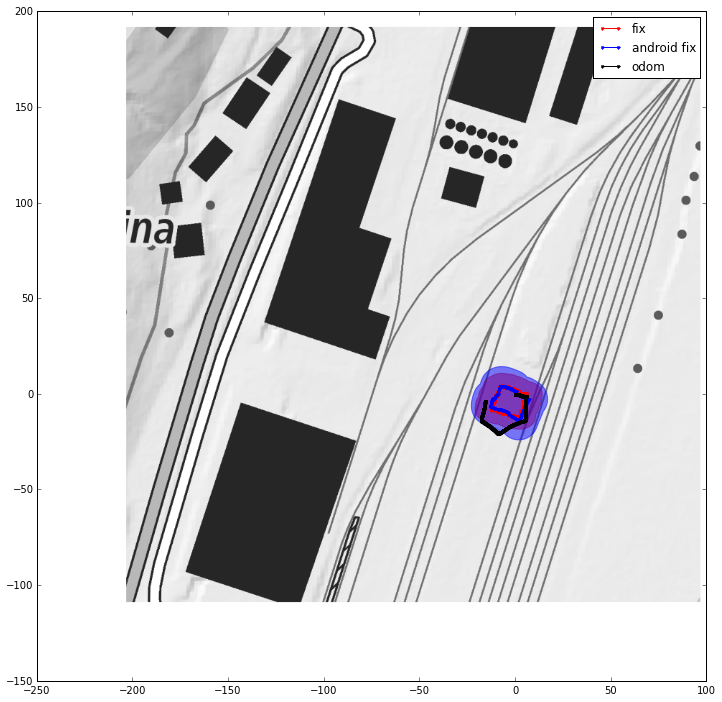

In [26]:
bag = rosbag.Bag('../bags/2016-03-24-13-11-54.bag')
plot_paths(bag)

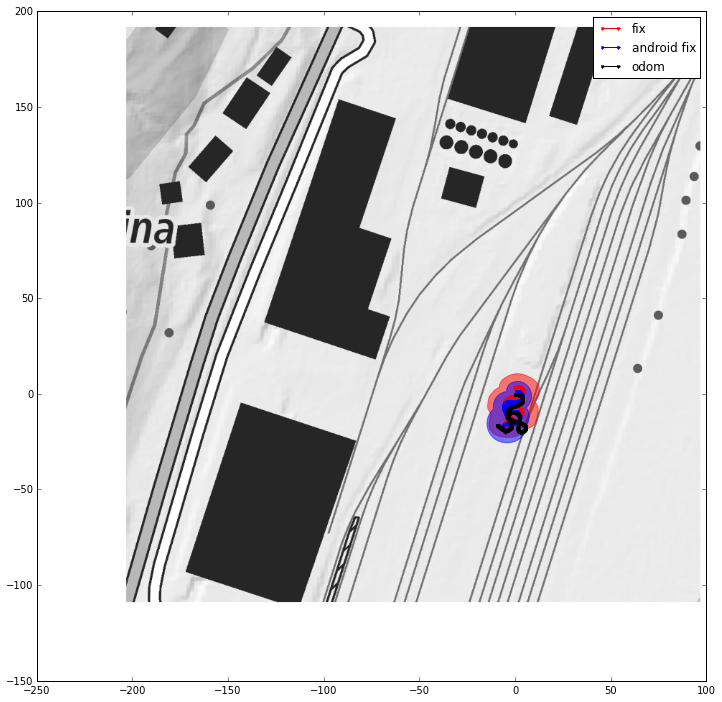

In [20]:
bag = rosbag.Bag('../bags/2016-03-24-13-14-55.bag')
plot_paths(bag)

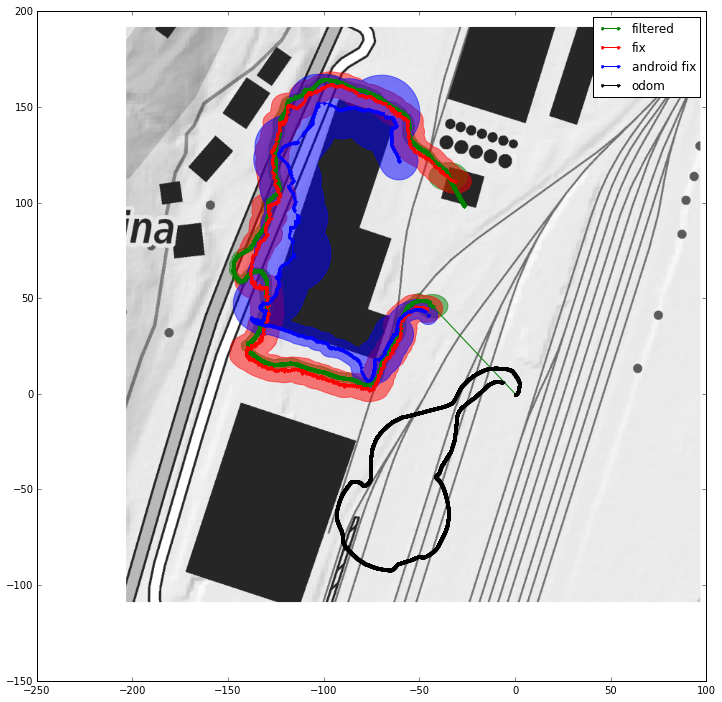

In [21]:
bag = rosbag.Bag('../bags/post_2016-03-24-22-22-25.bag')
plot_paths(bag)

In [22]:
bag = rosbag.Bag('../bags/post_2016-03-24-22-22-25.bag')

In [23]:
def odometry_yaw(bag, topic):
    ms = bag.read_messages(topics=[topic])
    return np.array([(ts.to_sec(), np.arcsin(d.pose.pose.orientation.z)*2) for _, d, ts in ms])

In [24]:
def imu_yaw(bag, topic):
    ms = bag.read_messages(topics=[topic])
    return np.array([(ts.to_sec(),np.arcsin(d.orientation.z)*2) for _, d, ts in ms])

def imu_yaw_speed(bag, topic):
    ms = bag.read_messages(topics=[topic])
    return np.array([(ts.to_sec(),d.angular_velocity.z) for _, d, ts in ms])

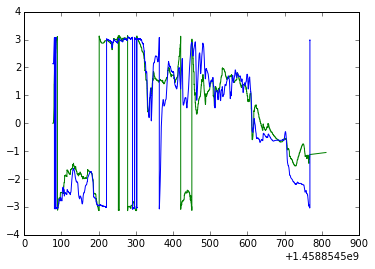

In [25]:
t, y = odometry_yaw(bag,'/odometry/filtered').T
plot(t,y,'green')
t, y = imu_yaw(bag,'/imu').T
plot(t,y,'blue')

# t, s = imu_yaw_speed(bag,'/imu').T
# ss = np.cumsum(s)*np.gradient(t)+y[0]
# ss = ( ss + np.pi) % (2 * np.pi ) - np.pi